In [1]:
#pip install scipy

In [2]:
import numpy as np
import pandas as pd
import seaborn  as sns
import matplotlib.pyplot as plt



In [3]:
df=pd.read_csv('D:/PYTHON/Raw_data.csv')

In [4]:
df

,Order_ID,Agent_Age,Agent_Rating,Store_Latitude,Store_Longitude,Drop_Latitude,Drop_Longitude,Order_Date,Order_Time,Pickup_Time,Weather,Traffic,Vehicle,Area,Delivery_Time,Category
0,ialx566343618,37,4.9,22.745049,75.892471,22.765049,75.912471,2022-03-19,11:30:00,11:45:00,Sunny,High,motorcycle,Urban,120,Clothing
1,akqg208421122,34,4.5,12.913041,77.683237,13.043041,77.813237,2022-03-25,19:45:00,19:50:00,Stormy,Jam,scooter,Metropolitian,165,Electronics
2,njpu434582536,23,4.4,12.914264,77.678400,12.924264,77.688400,2022-03-19,08:30:00,08:45:00,Sandstorms,Low,motorcycle,Urban,130,Sports
3,rjto796129700,38,4.7,11.003669,76.976494,11.053669,77.026494,2022-04-05,18:00:00,18:10:00,Sunny,Medium,motorcycle,Metropolitian,105,Cosmetics
4,zguw716275638,32,4.6,12.972793,80.249982,13.012793,80.289982,2022-03-26,13:30:00,13:45:00,Cloudy,High,scooter,Metropolitian,150,Toys
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43734,jlxf819993117,30,4.8,26.902328,75.794257,26.912328,75.804257,2022-03-24,11:35:00,11:45:00,Windy,High,motorcycle,Metropolitian,160,Home
43735,aevx342135787,21,4.6,0.000000,0.000000,0.070000,0.070000,2022-02-16,19:55:00,20:10:00,Windy,Jam,motorcycle,Metropolitian,180,Jewelry
43736,xnek760674819,30,4.9,13.022394,80.242439,13.052394,80.272439,2022-03-11,23:50:00,00:05:00,Cloudy,Low,scooter,Metropolitian,80,Home
43737,cynl434665991,20,4.7,11.001753,76.986241,11.041753,77.026241,2022-03-07,13:35:00,13:40:00,Cloudy,High,motorcycle,Metropolitian,130,Kitchen


In [5]:
df.describe() #use to understand descriptive statistics

,Agent_Age,Agent_Rating,Store_Latitude,Store_Longitude,Drop_Latitude,Drop_Longitude,Delivery_Time
count,43739.000000,43685.000000,43739.000000,43739.000000,43739.000000,43739.000000,43739.000000
mean,29.567137,4.633780,17.210960,70.661177,17.459031,70.821842,124.905645
std,5.815155,0.334716,7.764225,21.475005,7.342950,21.153148,51.915451
min,15.000000,1.000000,-30.902872,-88.366217,0.010000,0.010000,10.000000
25%,25.000000,4.500000,12.933298,73.170283,12.985996,73.280000,90.000000
50%,30.000000,4.700000,18.551440,75.898497,18.633626,76.002574,125.000000
75%,35.000000,4.900000,22.732225,78.045359,22.785049,78.104095,160.000000
max,50.000000,6.000000,30.914057,88.433452,31.054057,88.563452,270.000000


## Preliminary Observation:

**Delivery drivers' age range:** from 15 to 50 average is 29

**Agent Rating:** 1 to 6

**Delivery Time:** ranges from 10 to 270 minutes

## Potential Objectives:

1) Increase Agent Rating (potentially increase customer satisfaction)

2) Lower Delivery Times

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43739 entries, 0 to 43738
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Order_ID         43739 non-null  object 
 1   Agent_Age        43739 non-null  int64  
 2   Agent_Rating     43685 non-null  float64
 3   Store_Latitude   43739 non-null  float64
 4   Store_Longitude  43739 non-null  float64
 5   Drop_Latitude    43739 non-null  float64
 6   Drop_Longitude   43739 non-null  float64
 7   Order_Date       43739 non-null  object 
 8   Order_Time       43739 non-null  object 
 9   Pickup_Time      43739 non-null  object 
 10  Weather          43648 non-null  object 
 11  Traffic          43739 non-null  object 
 12  Vehicle          43739 non-null  object 
 13  Area             43739 non-null  object 
 14  Delivery_Time    43739 non-null  int64  
 15  Category         43739 non-null  object 
dtypes: float64(5), int64(2), object(9)
memory usage: 5.3+ MB


## Observations:

### 1. Longitude and Latitude -> columns 3,4,5,6

### 2. Time -> Column 7 (Order Date), Column 8 (Order Time), Column 14 (Delivery, Time) are the columns in relation to time. This can be easily deducted since the columns have 'time' incorporated to naming of the columns.

### Column 14 is in integer format denoted by int64

### Column 7 (Order Date) and column 8 (Order Time) are object formats. We can dig a little to verify what type of format it is in next code block


### Checking what type of values the Order, Time and Pickup Time columns are: 

In [7]:
order_time_sample= df['Order_Time'].head(5)

pickup_time_sample =df['Pickup_Time'].head(5)

print(order_time_sample)

print(pickup_time_sample)

0    11:30:00
1    19:45:00
2    08:30:00
3    18:00:00
4    13:30:00
Name: Order_Time, dtype: object
0    11:45:00
1    19:50:00
2    08:45:00
3    18:10:00
4    13:45:00
Name: Pickup_Time, dtype: object


### From the output of the time values, we can see that they are Strings in HH:MM:SS format.

### Will need to convert to standarized time format for the columns

# __Data Cleaning__

In [8]:
df.isnull().sum() # oveall null values 

Order_ID            0
Agent_Age           0
Agent_Rating       54
Store_Latitude      0
Store_Longitude     0
Drop_Latitude       0
Drop_Longitude      0
Order_Date          0
Order_Time          0
Pickup_Time         0
Weather            91
Traffic             0
Vehicle             0
Area                0
Delivery_Time       0
Category            0
dtype: int64

### These columns have null value:
- Agent_Rating: 54 rows
- Weather: 91 rows          

<Axes: >

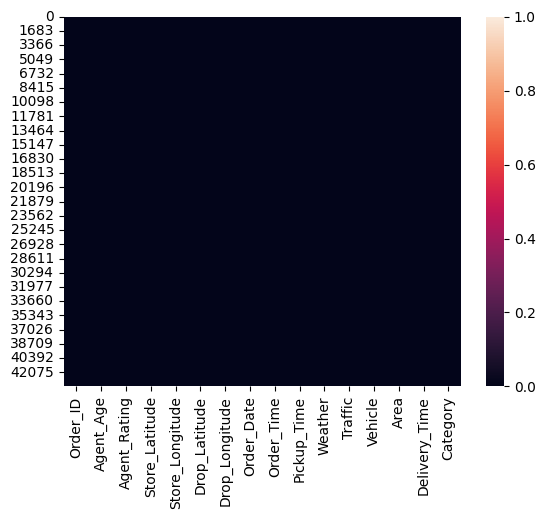

In [9]:
sns.heatmap(df.isnull())


In [10]:
df['Weather'].head()

0         Sunny
1        Stormy
2    Sandstorms
3         Sunny
4        Cloudy
Name: Weather, dtype: object

#### Looking into 'Weather' column the data is Categorical data

In [11]:
df['Agent_Rating'].head()

0    4.9
1    4.5
2    4.4
3    4.7
4    4.6
Name: Agent_Rating, dtype: float64

#### Looking into 'Agent_Rating column the data is Numerical data

## Observation:

- Agent Rating column has 54 missing values and are numeric data

- Weather column has 91 missing values and are categorical

#### Solution: The number of missing data pieces are not many. Therefore, we can either drop the columns with missing data or fill the missing values.


#### If filling the data

numerical -> replace the missing values with 'mean' values; since filling them in would not result in change in the mean of the entire column

categorical -> replace the missing values with 'mode' values. 
Though possess risk of over representation of one category, but based on previous univariate analysis of Weather' column, this should not be a major concern since number to fill is low and the count occurrence do not vary much from category to category

In [12]:
#Handle missing values

#Agent Rating (numeric -> mean)

df["Agent_Rating"] =df["Agent_Rating"].fillna (df["Agent_Rating"].mean())

#Weather (categorical-> mode), this method does not require "inplace True"

#since overwriting column with new column

df['Weather'] =df['Weather'].fillna(df['Weather'].mode()[0])

 #### Check if the missing value have been filled in

In [13]:
df.isnull().sum() # oveall null values bata ta hai

Order_ID           0
Agent_Age          0
Agent_Rating       0
Store_Latitude     0
Store_Longitude    0
Drop_Latitude      0
Drop_Longitude     0
Order_Date         0
Order_Time         0
Pickup_Time        0
Weather            0
Traffic            0
Vehicle            0
Area               0
Delivery_Time      0
Category           0
dtype: int64

##### All the missing values have been filled in accordingly

### Longitude and Latitude

#### There were some observations where both longitude and latitude were 0; coordinates being 0,0

#### According to research, longitude and latitude of 0,0 refers to Null Island (not landmass but points to ocean body of water).

#### Therefore, filtration/exclusion of such data points are needed in order to have proper GIS (Geographic Information System) analysis.

In [14]:
filtered_data = df[(df['Store_Latitude']==0) & (df['Store_Longitude'] == 0)] 
filtered_data.head()

,Order_ID,Agent_Age,Agent_Rating,Store_Latitude,Store_Longitude,Drop_Latitude,Drop_Longitude,Order_Date,Order_Time,Pickup_Time,Weather,Traffic,Vehicle,Area,Delivery_Time,Category
33,zotl583816092,32,3.5,0.0,0.0,0.11,0.11,2022-03-08,21:35:00,21:45:00,Stormy,Jam,scooter,Urban,35,Grocery
51,dcdm719150402,25,5.0,0.0,0.0,0.03,0.03,2022-02-13,22:10:00,22:25:00,Cloudy,Low,motorcycle,Metropolitian,75,Home
56,bbow373480117,39,4.2,0.0,0.0,0.08,0.08,2022-03-02,20:35:00,20:50:00,Fog,Jam,scooter,Semi-Urban,245,Apparel
58,etss702593505,36,4.7,0.0,0.0,0.06,0.06,2022-03-13,20:15:00,20:20:00,Cloudy,Jam,motorcycle,Metropolitian,150,Sports
66,emlt327861941,23,4.8,0.0,0.0,0.02,0.02,2022-03-07,10:40:00,10:50:00,Stormy,Low,scooter,Metropolitian,15,Grocery


In [15]:
len(filtered_data)

3505

#### Looking at column 4 and 5, we can see that indeed there are locations where location originates from coordinates 0,0

#### These points would be excluded from GIS. 3505 data points would not be used for GIS purposes.


In [16]:
#exclude data with Longitude 0.0 and Latitude 0.0
df= df[ (df['Store_Latitude'] != 0) & (df['Store_Longitude'] != 0)]

df.head()


,Order_ID,Agent_Age,Agent_Rating,Store_Latitude,Store_Longitude,Drop_Latitude,Drop_Longitude,Order_Date,Order_Time,Pickup_Time,Weather,Traffic,Vehicle,Area,Delivery_Time,Category
0,ialx566343618,37,4.9,22.745049,75.892471,22.765049,75.912471,2022-03-19,11:30:00,11:45:00,Sunny,High,motorcycle,Urban,120,Clothing
1,akqg208421122,34,4.5,12.913041,77.683237,13.043041,77.813237,2022-03-25,19:45:00,19:50:00,Stormy,Jam,scooter,Metropolitian,165,Electronics
2,njpu434582536,23,4.4,12.914264,77.678400,12.924264,77.688400,2022-03-19,08:30:00,08:45:00,Sandstorms,Low,motorcycle,Urban,130,Sports
3,rjto796129700,38,4.7,11.003669,76.976494,11.053669,77.026494,2022-04-05,18:00:00,18:10:00,Sunny,Medium,motorcycle,Metropolitian,105,Cosmetics
4,zguw716275638,32,4.6,12.972793,80.249982,13.012793,80.289982,2022-03-26,13:30:00,13:45:00,Cloudy,High,scooter,Metropolitian,150,Toys


### df datframe conatins data with longitude =0.0 and lattitude=0.0 filtered out

## Order Date



### The dates are in 3/19/2022 formart. Will find out which format they are in :


In [17]:

#String datatype?

if pd.api.types.is_string_dtype(df['Order_Date']):
    print("String DType")
else:
    print("Not String")



String DType


#### Since they are in String format they will converted to datetime format

In [18]:
#convert String to Datetine

df['Order_Date']=pd.to_datetime(df['Order_Date'],errors='coerce')

C:\Users\admin\AppData\Local\Temp\ipykernel_12776\2603023969.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Order_Date']=pd.to_datetime(df['Order_Date'],errors='coerce')


In [19]:
#is the column in datetime format?

if pd.api.types.is_datetime64_any_dtype(df['Order_Date']):
    print("DateTime Formart")
else:
    print("Not in DateTime Formart")



DateTime Formart


#### Therefore, the dates that were in String format has been converted to Datetime format successfully.

## Delivery Times

In [20]:
df.info()


<class 'pandas.core.frame.DataFrame'>
Index: 40234 entries, 0 to 43738
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   Order_ID         40234 non-null  object        
 1   Agent_Age        40234 non-null  int64         
 2   Agent_Rating     40234 non-null  float64       
 3   Store_Latitude   40234 non-null  float64       
 4   Store_Longitude  40234 non-null  float64       
 5   Drop_Latitude    40234 non-null  float64       
 6   Drop_Longitude   40234 non-null  float64       
 7   Order_Date       40234 non-null  datetime64[ns]
 8   Order_Time       40234 non-null  object        
 9   Pickup_Time      40234 non-null  object        
 10  Weather          40234 non-null  object        
 11  Traffic          40234 non-null  object        
 12  Vehicle          40234 non-null  object        
 13  Area             40234 non-null  object        
 14  Delivery_Time    40234 non-null  int64     

### __For simplicity in having "clean" data, the time data will be filtered from cleaned GIS data__

### Based on preprocessing stages, we have found that there are 3 columns which are involved with time:
- 8 Order_Time 40234 non-null  object
- 9   Pickup_Time      40234 non-null  object
-  14  Delivery_Time    40234 non-null  int64

Let's select those column & see the outputs in a bit more detail. 

In [21]:
time_columns=['Order_Time', 'Pickup_Time', 'Delivery_Time']

time_data = df[time_columns]

time_data.head()

,Order_Time,Pickup_Time,Delivery_Time
0,11:30:00,11:45:00,120
1,19:45:00,19:50:00,165
2,08:30:00,08:45:00,130
3,18:00:00,18:10:00,105
4,13:30:00,13:45:00,150


#### Looking at row 0, we can see that it took 15min to pickup the order then 120 min to deliver. At row 1, order pick up time is 5 minutes and then 165 to deliver the order.

Therefore, we can safely assume that: __Total_Time =(Pickup_Time - Order_Time) + Delivery_Time__

Procedure to obtain 'Total_Time':

- Convert the Strings into time data formats

-  Use the derived formulation and create new column "Total Time"

In [22]:
#This code removes leading/trailing whitespaces

df['Order_Time'] = df['Order_Time'].apply(lambda x: str(x).strip() if isinstance(x, str) else x)
df['Pickup_Time'] = df['Pickup_Time'].apply(lambda x: str(x).strip() if isinstance(x, str) else x)

#Removing whitespaces was necessary since that prevented code from running
df['Order_Time'] = pd.to_timedelta(df['Order_Time'], errors='coerce')
df['Pickup_Time'] = pd.to_timedelta(df['Pickup_Time'], errors='coerce')

C:\Users\admin\AppData\Local\Temp\ipykernel_12776\1481647101.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Order_Time'] = df['Order_Time'].apply(lambda x: str(x).strip() if isinstance(x, str) else x)
C:\Users\admin\AppData\Local\Temp\ipykernel_12776\1481647101.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Pickup_Time'] = df['Pickup_Time'].apply(lambda x: str(x).strip() if isinstance(x, str) else x)
C:\Users\admin\AppData\Local\Temp\ipykernel_12776\1481647101.py:7: SettingWithCopyWarning:

In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 40234 entries, 0 to 43738
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype          
---  ------           --------------  -----          
 0   Order_ID         40234 non-null  object         
 1   Agent_Age        40234 non-null  int64          
 2   Agent_Rating     40234 non-null  float64        
 3   Store_Latitude   40234 non-null  float64        
 4   Store_Longitude  40234 non-null  float64        
 5   Drop_Latitude    40234 non-null  float64        
 6   Drop_Longitude   40234 non-null  float64        
 7   Order_Date       40234 non-null  datetime64[ns] 
 8   Order_Time       40153 non-null  timedelta64[ns]
 9   Pickup_Time      40234 non-null  timedelta64[ns]
 10  Weather          40234 non-null  object         
 11  Traffic          40234 non-null  object         
 12  Vehicle          40234 non-null  object         
 13  Area             40234 non-null  object         
 14  Delivery_Time    40234 non-

In [24]:
#Calculate the time difference between Order Time and Pickup Time

df['Get_Order_Time']= df['Pickup_Time'] - df['Order_Time']

#Finding the time difference in minutes.

df['Get_Order_Time']= df['Get_Order_Time'].dt.total_seconds()/60

C:\Users\admin\AppData\Local\Temp\ipykernel_12776\2660771050.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Get_Order_Time']= df['Pickup_Time'] - df['Order_Time']
C:\Users\admin\AppData\Local\Temp\ipykernel_12776\2660771050.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Get_Order_Time']= df['Get_Order_Time'].dt.total_seconds()/60


In [25]:
df ['Get_Order_Time']= df ['Get_Order_Time'].astype('Int64')

df['Get_Order_Time'].head()

C:\Users\admin\AppData\Local\Temp\ipykernel_12776\6887751.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df ['Get_Order_Time']= df ['Get_Order_Time'].astype('Int64')


0    15
1     5
2    15
3    10
4    15
Name: Get_Order_Time, dtype: Int64

#### We obtained the time difference from when,when the order was made to order pick up time.

#### Observation: There were negative time values. This does not make sense

#### The hypothesis is that some time values were null which made the results of those rows negative and not useful.

#### Tested to confirm that there were negative time results:

In [26]:
#Initially thought that the data was clean but

negative_values_count = (df['Get_Order_Time']<0).sum()

print(negative_values_count)

759


#### There are 759 time results which have negative results.These will bre filtered  out for time calculations 

In [27]:
# only keep the datasets where time difference >0
df=df[df['Get_Order_Time']>0]

In [28]:
df['Total_Time'] = df['Get_Order_Time'] + df['Delivery_Time']
df['Total_Time'].head()

0    135
1    170
2    145
3    115
4    165
Name: Total_Time, dtype: Int64

C:\Users\admin\AppData\Local\Temp\ipykernel_12776\2509652438.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Binned',data=df, palette='viridis')


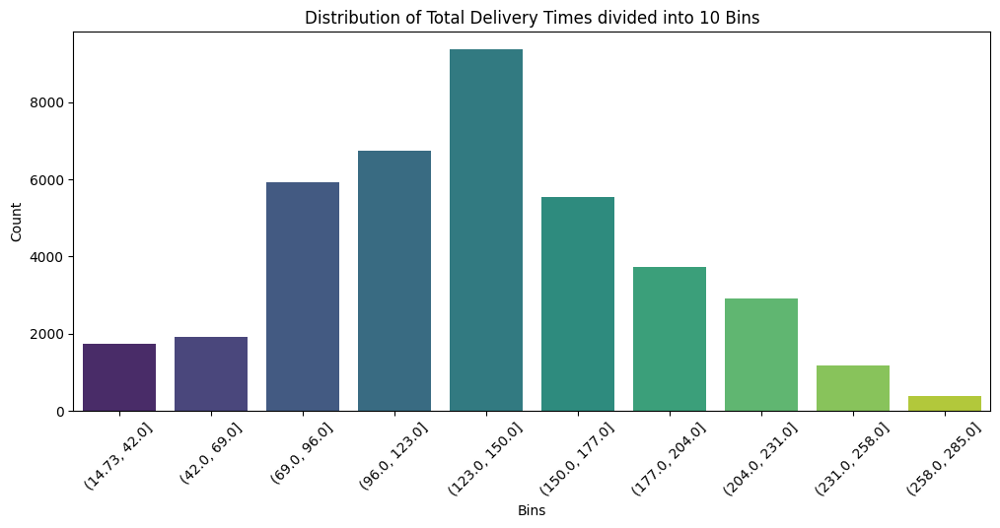

In [29]:

#Create 10 bins using pandas.cut

df['Binned']= pd.cut(df['Total_Time'],bins=10)

#Plot the data using seaborn

plt.figure(figsize=(12, 5))

sns.countplot(x='Binned',data=df, palette='viridis')

plt.title('Distribution of Total Delivery Times divided into 10 Bins')

plt.xlabel('Bins')

plt.ylabel("Count")

plt.xticks(rotation=45)

plt.show()

# __EDA (Exploratory Data Analysis )__

## Correlation Matrix

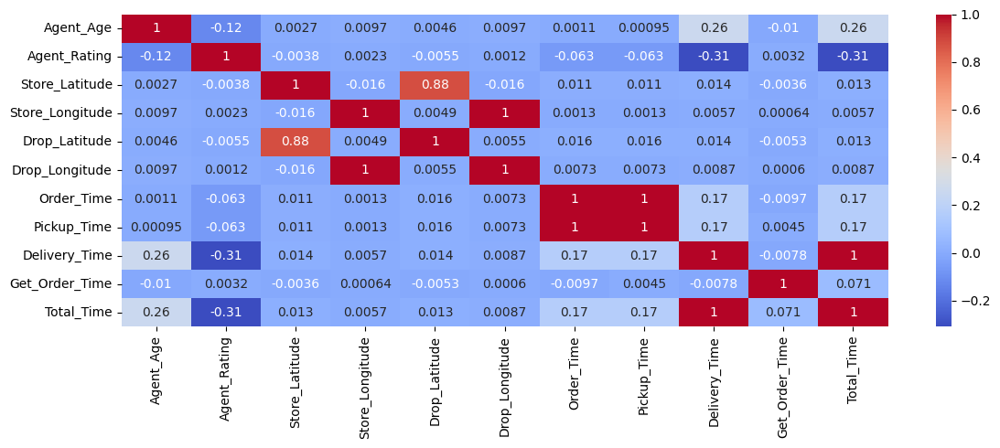

In [30]:
df_numeric = df.select_dtypes(include =['number'])

# compute correlation matrix
correlation_matrix = df_numeric.corr()
plt.figure(figsize=(12, 5))
sns.heatmap(data=correlation_matrix,annot=True,cmap='coolwarm')
plt.tight_layout()
plt.show()

__Information about correlation__

__Negative Correlation__ would be in the range of -0.6 to 0

__Positive Correlation__ from 0 to 1

__No Correlation__ 0

Based on the correlation matrix, here are some things to note:

1. __Strong Negative Correlation (-0.3) for Agent Rating and Delivery Time__. This means that with lower delivery time, agent rating tends to be higher (and vice versa).

2. __Moderate Positive Correlation for Delivery Time and Agent Age (0.4)__ meaning that older the age of the driver, the likelihood for delivery time to be longer.

3. __Moderate Negative Correlation for Agent Age and Agent Rating (-0.39)__ meaning that younger the driver, the higher the rating. This is likely due to lower delivery times from younger drivers

__Interesting Finding__: It appears that faster (lower) delivery times leads to higher ratings.

It can be assumed that there are other factors than delivery times to consider agent rating but due to the limitations of the dataset, ex, there is no data regarding delivery accuracy

However, we can solidify our findings that: __lower the delivery time means higher customer satisfaction__

Therefore, this study will focus on finding methods to lower delivery times.

Other notes: __Store and Drop Longitude and Latitude have perfect correlation__., suggesting that delivery locations are geographically related to store locations

## Agent Rating Unvariant Analysis And Purpose of this Study

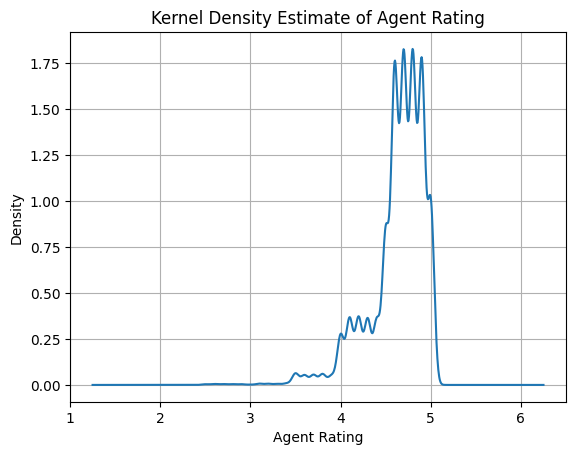

In [31]:
# Agent Rating Unvariant Analysis And Purpose of this Study
df['Agent_Rating'].plot(kind='kde')

plt.title('Kernel Density Estimate of Agent Rating')
plt.xlabel('Agent Rating')
plt.ylabel('Density')
plt.grid(True)
plt.show()

This is the plot of the Agent Rating column. This is the area of focus since is the metric which would bring in higher customer satisfaction

We have found that there is highest correlation with "Delivery Time" and "Rating".

__The objective of this study is to find ways to lower delivery time so that we can increase the ratings.__

## Which month of year has the most deliveries?

Though not directly related to Agent Rating, here is an interesting finding

<Axes: xlabel='month', ylabel='count'>

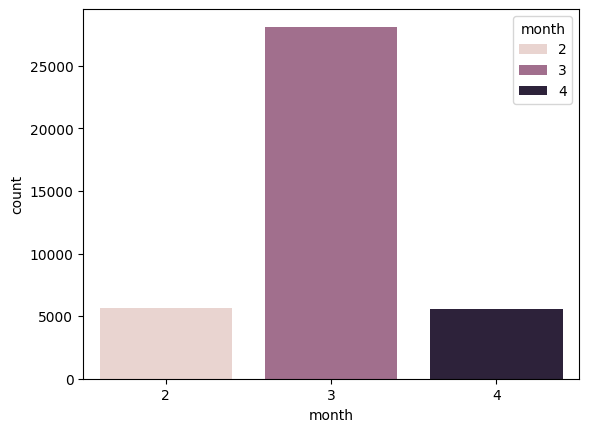

In [32]:
df['month']=df['Order_Date'].dt.month
sns.countplot(x=df['month'],hue=df['month'])


After Grouping by the month we find out March is the month with most sales is this so for a certain product category or all categories ? 
we will find out in block

In [33]:
month_sales = pd.pivot_table(
    df, 
    index=['Category'], 
    columns=['month'], 
    values='Order_ID', 
    aggfunc='count'  # Replace 'count' with the desired aggregation function
)

# Display the pivot table
print(month_sales)


month           2     3    4
Category                    
Apparel       368  1753  333
Books         364  1805  360
Clothing      313  1740  335
Cosmetics     374  1685  331
Electronics   334  1856  372
Grocery       311  1763  341
Home          343  1756  347
Jewelry       358  1792  383
Kitchen       366  1671  362
Outdoors      376  1778  345
Pet Supplies  362  1732  342
Shoes         360  1700  346
Skincare      318  1828  359
Snacks        372  1767  322
Sports        370  1697  371
Toys          386  1791  356


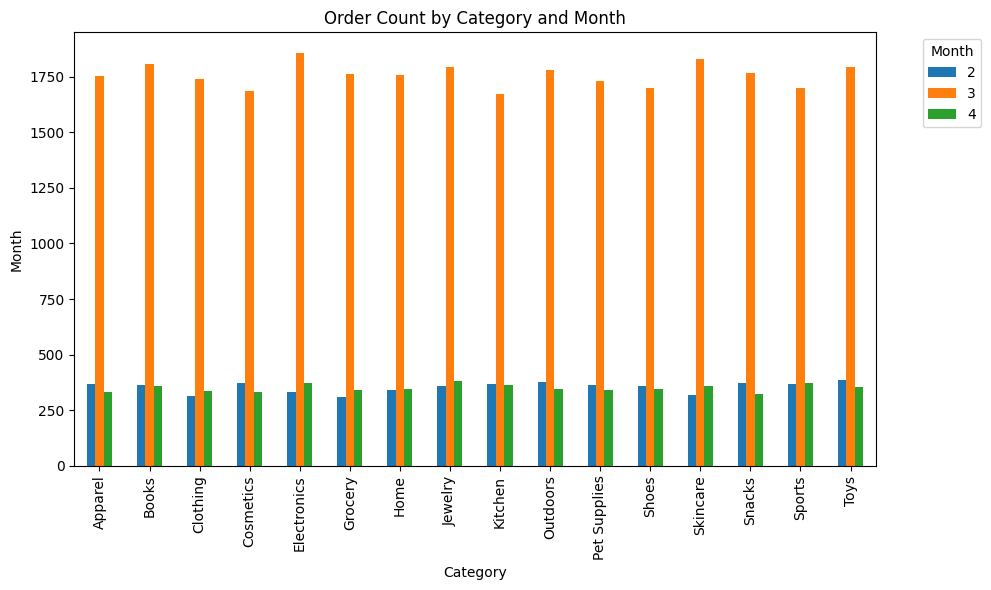

In [34]:
# plot the data as a bar graph 
month_sales.plot(kind='bar',figsize=(10,6))

#customize the plot 
plt.title('Order Count by Category and Month')
plt.xlabel('Category')
plt.ylabel('Month')
plt.legend(title='Month',bbox_to_anchor=(1.05,1),loc='upper left')
plt.tight_layout()
plt.show()

By Grouping Category  and Month of Sales we were able to verify that __all caegories of product deliver much higher numbers in the month march__

## Agent Age

<Axes: xlabel='Agent_Age', ylabel='Agent_Rating'>

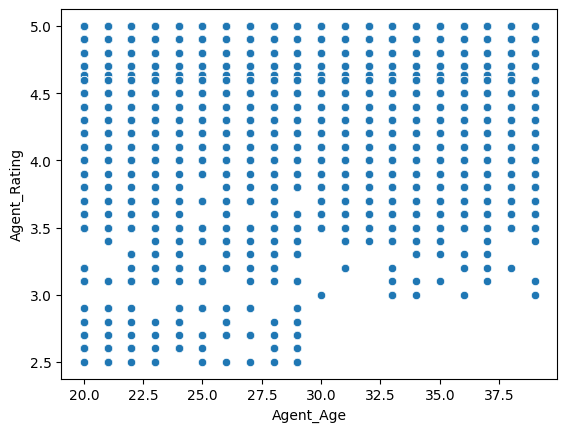

In [35]:
sns.scatterplot(x=df['Agent_Age'],y=df['Agent_Rating'])

Since the output of the scatter plot is not in a 'square box' like form .this is an interesting finding further code blocks digs deeper

In [36]:
# Group by Age and Calculate the mean of Delivery_Time
result = df.groupby('Agent_Age',as_index=False)['Delivery_Time'].mean()

#Display the result
print(result)

    Agent_Age  Delivery_Time
0          20     108.892913
1          21     109.903427
2          22     108.996486
3          23     111.519515
4          24     109.124626
5          25     109.195797
6          26     110.313715
7          27     108.829457
8          28     111.390269
9          29     109.180899
10         30     138.729676
11         31     142.341053
12         32     144.324352
13         33     141.733401
14         34     140.118817
15         35     138.993201
16         36     141.069995
17         37     140.298851
18         38     140.385585
19         39     140.833845


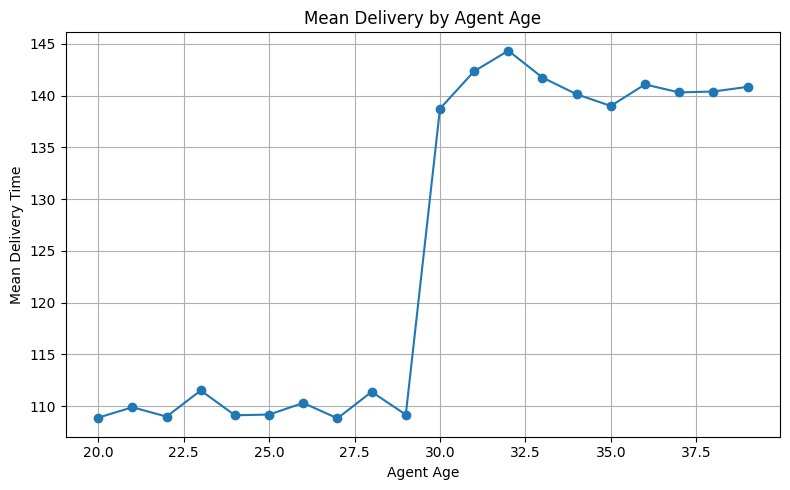

In [37]:
#Plot the grouped date as line graph

plt.figure(figsize=(8,5))
plt.plot(result['Agent_Age'],result['Delivery_Time'],marker='o',linestyle='-')

#customize the plot 
plt.title('Mean Delivery by Agent Age')
plt.xlabel('Agent Age')
plt.ylabel('Mean Delivery Time')
plt.grid(True)
plt.tight_layout()

#Show the plot
plt.show()

What is very intresting finding is that younger drivers trends to have significantly lower delivery times than that of older driver (age>30).
however , as stated before we will need to see if age really does impact ratings

In [38]:
# Group by Age and Calculate the mean of Delivery_Time
res = df.groupby('Agent_Age',as_index=False)['Agent_Rating'].mean()

#Display the result
print(res)

    Agent_Age  Agent_Rating
0          20      4.683378
1          21      4.681482
2          22      4.672290
3          23      4.687342
4          24      4.675108
5          25      4.673945
6          26      4.673815
7          27      4.675986
8          28      4.684289
9          29      4.670962
10         30      4.597075
11         31      4.584807
12         32      4.579072
13         33      4.593276
14         34      4.591756
15         35      4.594690
16         36      4.600050
17         37      4.602483
18         38      4.590777
19         39      4.579090


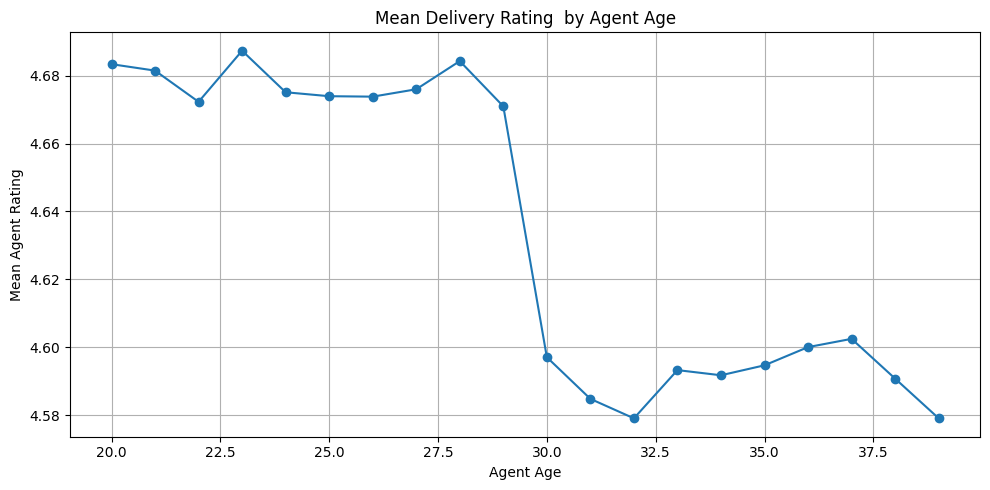

In [39]:
#Plot the grouped data as a line graph

plt.figure(figsize=(10,5))
plt.plot(res['Agent_Age'],res['Agent_Rating'],marker='o',linestyle='-')

#customize the plot 
plt.title('Mean Delivery Rating  by Agent Age')
plt.xlabel('Agent Age')
plt.ylabel('Mean Agent Rating')
plt.grid(True)
plt.tight_layout()

#Show the plot
plt.show()

Conclusion :
- Fastest Delivery Time lead to higher Agent Rating
- Younger drivers are faster at making shorter deliveries time
  
Therefore younger drivers deliver faster which lead to higher ratings
  

## Suggestion to Improve Delivery Time

#### Category and Delivery Time

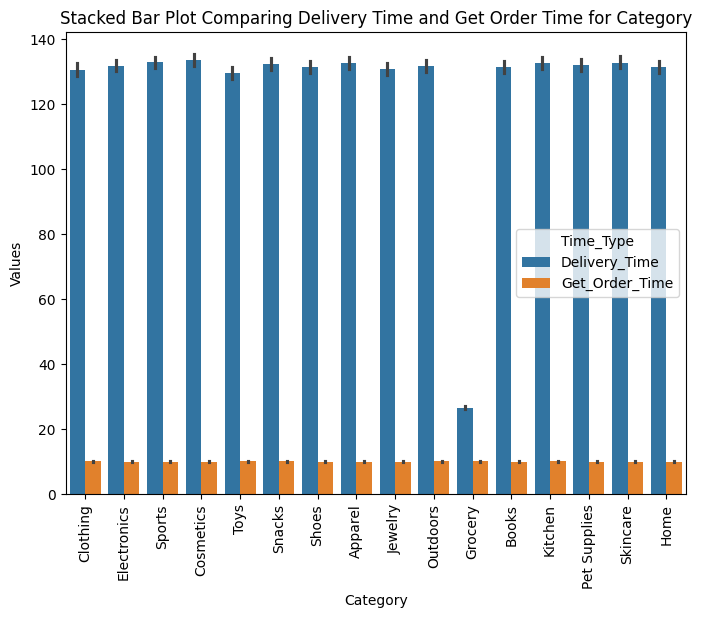

In [40]:
#Reshape the DataFrame to long format

df_long = df.melt(id_vars="Category", value_vars = ["Delivery_Time", "Get_Order_Time"], var_name = "Time_Type", value_name="Value")

# Create the stacked bar plot using Seaborn

plt.figure(figsize=(8, 6))

sns.barplot(x="Category", y="Value", hue = "Time_Type", data=df_long)

#Rotate x-axis labels by 90 degrees

plt.xticks(rotation=90)

# Display the plot

plt.title('Stacked Bar Plot Comparing Delivery Time and Get Order Time for Category')

plt.xlabel('Category')

plt.ylabel('Values')

plt.show()

Observation:

- Order time to Pickup at Store time: this is equal regardless of product category

- Pickup at Store Time to Delivery Destination Time: All products are approximately equal except for groceries.

__Groceries have the lower average delivery time from the store pickup to destionation__

### Interaction between Traffic Density , Vehicle Type ,Delivery Time 

In [41]:
df.columns

Index(['Order_ID', 'Agent_Age', 'Agent_Rating', 'Store_Latitude',
       'Store_Longitude', 'Drop_Latitude', 'Drop_Longitude', 'Order_Date',
       'Order_Time', 'Pickup_Time', 'Weather', 'Traffic', 'Vehicle', 'Area',
       'Delivery_Time', 'Category', 'Get_Order_Time', 'Total_Time', 'Binned',
       'month'],
      dtype='object')

In [42]:
#Group by Traffic' and 'Vehicle', calculate the mean of 'Delivery, Time
rsult= df.groupby(['Traffic', 'Vehicle'], as_index=False) ['Delivery_Time'].mean()

#Get the count of occurrences of each combination of Traffic and Vehicle 
count_result = df.groupby(['Traffic', 'Vehicle']).size().reset_index(name="Count")

#Merge the two results to include the count of occurrences 
final_result = pd.merge(rsult, count_result, on=['Traffic', 'Vehicle'])

#Display the final result
print(final_result)

    Traffic      Vehicle  Delivery_Time  Count
0     High   motorcycle      137.325741   2327
1     High      scooter      118.031131   1317
2     High           van     119.300654    306
3      Jam   motorcycle      155.723693   7365
4      Jam      scooter      137.748183   4265
5      Jam           van     134.243427   1027
6      Low   motorcycle      105.422816   7670
7      Low      scooter       94.905577   4321
8      Low           van      94.601190   1008
9   Medium   motorcycle      132.888327   5731
10  Medium      scooter      118.326699   3266
11  Medium           van     119.877370    791


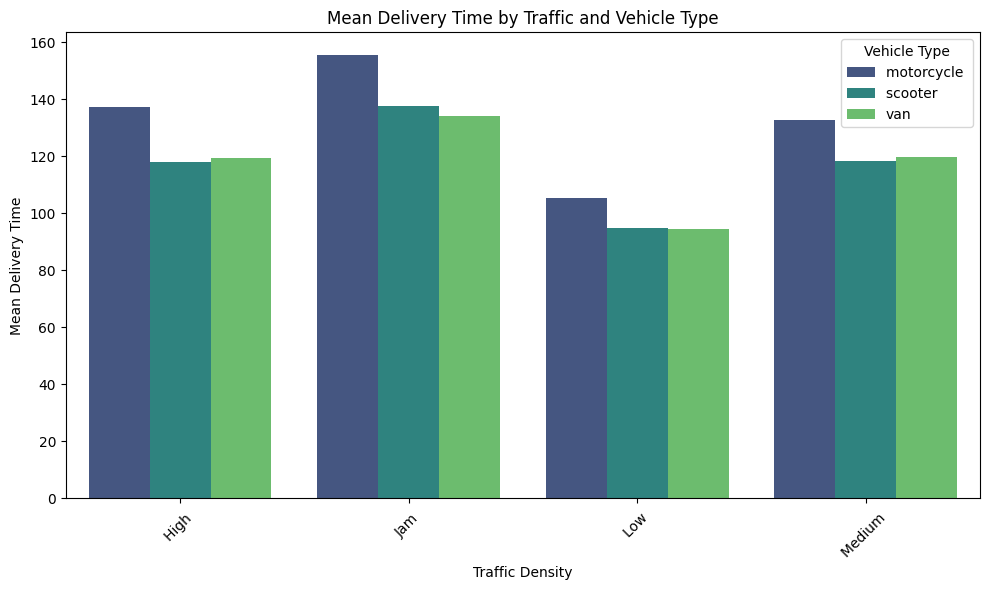

In [43]:
# Plot using seaborn


plt.figure(figsize=(10, 6))

sns.barplot(data = rsult, x='Traffic', y='Delivery_Time', hue = 'Vehicle', palette= 'viridis')

#Customize the plot

plt.title('Mean Delivery Time by Traffic and Vehicle Type')

plt.ylabel('Mean Delivery Time')

plt.xlabel('Traffic Density')

plt.legend(title='Vehicle Type')

plt.xticks(rotation=45)

plt.tight_layout()

plt.show()

Observation:

- Delivery Time: Jam > High > Medium > Low

- __Motorcylces do have a higher delivery time__ compared to other methods of transportation.

- Hypothesis: perhaps finding difficulty locking the motorcylce to complete delivery?

<Axes: xlabel='Vehicle', ylabel='count'>

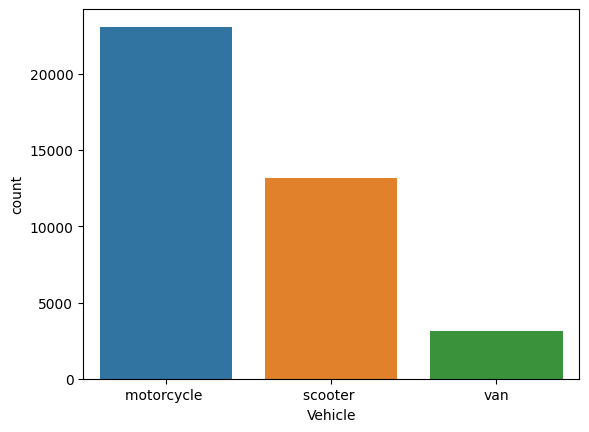

In [44]:
sns.countplot(data=df,x=df["Vehicle"],hue='Vehicle')

This is significant finding since motorcycles are used by far the most in term of method of transportation

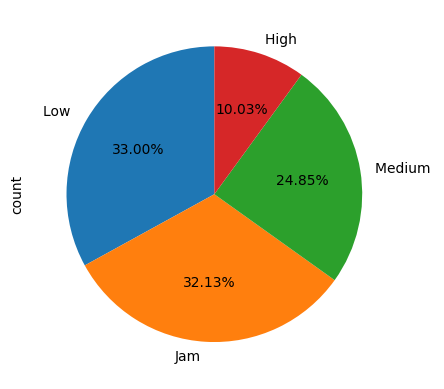

In [45]:
df['Traffic'].value_counts().plot(kind = 'pie',autopct='%.2f%%',startangle=90)
plt.show()

It appers that 32.13% of traffic is classified as 'jam'.If we can find methods to lower jam ,we can definely decrease  velivery times

## Does type of area impact Delivery time

<Axes: xlabel='Area', ylabel='Delivery_Time'>

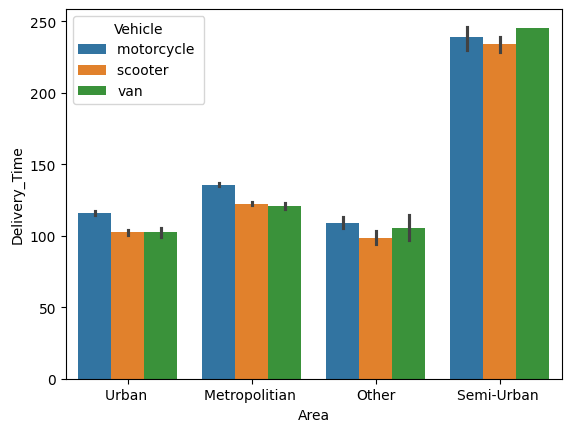

In [46]:
sns.barplot(df,y=df['Delivery_Time'],x=df['Area'],hue=df['Vehicle'])

The Part of the area where the delivery is held definately impact delivery times .  
__Semi-Urban areas are the areas where the delivery time is negatively impacted.__ 

## Does Weather impact  delivery time

<Axes: xlabel='Weather', ylabel='count'>

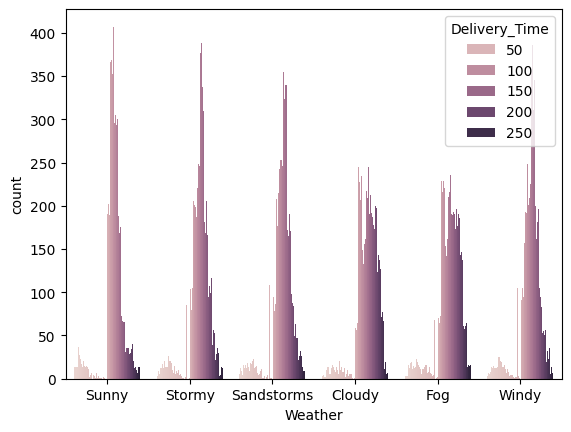

In [47]:
sns.countplot(x=df['Weather'],hue=df['Delivery_Time'])


Weather does also seem to impact delivery times.It appears 'bad' weather conditions (coudy,fog) do cause faster delivery times,  
Likely because bad Weather causes lower traffic

# GIS(Geographic Information System)

In [48]:
#pip install geopandas

In [49]:
#pip install folium

In [50]:
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster


In [51]:
#Create a GeoDataFrame from the DataFrame

geometry= gpd.points_from_xy(df.Store_Longitude, df.Store_Latitude)
geo_df = gpd.GeoDataFrame(df[["Store_Latitude", "Store_Longitude"]], geometry = geometry)

#Get the average latitude and longitude to center the map 
map_center = [geo_df.geometry.y.mean(), geo_df.geometry.x.mean()]

#Create a Folium map centered around the average latitude and longitude

m=folium.Map(location=map_center, zoom_start=5)

# Create a MarkerCluster to group markers 
marker_cluster = MarkerCluster().add_to(m)

#Add markers to the cluster 
for _, row in geo_df.iterrows():
    folium. Marker([row['Store_Latitude'], row['Store_Longitude']]).add_to(marker_cluster)

#Display the map
m

In [52]:
from folium.plugins import HeatMap

#Combine store and drop locations for heatmap
locations = df[['Store_Latitude', 'Store_Longitude']].values.tolist() + df [['Drop_Latitude','Drop_Longitude']].values.tolist()

#Create a base map 
m_heat= folium. Map(location=map_center,zoom_start=5)

#Add heatmap

HeatMap(locations).add_to(m_heat)

#Display Heatmap

m_heat

In [53]:
df.columns

Index(['Order_ID', 'Agent_Age', 'Agent_Rating', 'Store_Latitude',
       'Store_Longitude', 'Drop_Latitude', 'Drop_Longitude', 'Order_Date',
       'Order_Time', 'Pickup_Time', 'Weather', 'Traffic', 'Vehicle', 'Area',
       'Delivery_Time', 'Category', 'Get_Order_Time', 'Total_Time', 'Binned',
       'month'],
      dtype='object')

# Suggestions to improve Delivery Times (implications that this leads to better customer satisfaction [ex. agent_rating])


Lowering delivery times has a high correlation (0.7) in increasing agent rating (customer satisfaction)

Suggestions to lower delivery times :
Suggestions to lower delivery times

1. Younger drivers tend to deliver faster than older drivers

2. Time order received to order pick up at store is pretty much the same for all product category types. Focus on reducing delivery times from the store to final destination.

3. Grocery delivery on average is the category with the fastest average delivery times

4. Motorcycles are the slowest method of transportation and they are the most used. Try emphasizing scooter or van instead.

5. Jam and High level of traffic significantly increase delivery times. Finding an alternate route with lower level of traffic might help since they are a quite significant occurence level of traffic encountered

6. Out of all areas, semi-urban is significantly slower at delivery times. Other types of areas are significantly lower.

7. "Bad Weather" seems to decrease delivery times. It's likely that there are lower levels of traffic during such weather conditions